# Supply-demand prediction 🗺️📈
---

**Author:** Radu Beche

**Problem description:**

1) Explore the data and suggest a solution to guide the drivers towards areas with higher expected demand at given time and location 
2) Build and document a baseline model for your solution
3) Describe how you would design and deploy such a model
4) Describe how to communicate model recommendations to drivers
5) Think through and describe the design of the experiment  that would validate your solution for live operations taking into account marketplace specifics

## Table of contents

1) [Imports](#imports) 
2) [Data](#data)
3) [Preproceessing](#preproc)
4) [Feature analysis](#feature)
5) [Geospatial analysis](#geospacial)
6) [Baseline model](#baseline)
7) [Documentation](#docs)

# Imports 😶‍🌫️ <a name="imports" />
---

In [1]:
%load_ext autoreload
%autoreload 2
import os
# os.chdir(r'.\interview_challenge')

In [2]:
import bokeh
import warnings

import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt

from h3 import h3
from geopy import distance
from tqdm.auto import tqdm
from shapely.geometry import Point
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose

from bokeh.layouts   import row
from bokeh.palettes  import viridis, inferno
from bokeh.transform import transform
from bokeh.plotting  import figure, output_file, show
from bokeh.models    import (BasicTicker, ColorBar, ColumnDataSource, LinearColorMapper, HoverTool)
from bokeh.tile_providers import OSM, get_provider

tqdm.pandas()
plt.style.use('dark_background')
bokeh.io.output_notebook()
warnings.filterwarnings("ignore")

tile_provider = get_provider(OSM)

Loading BokehJS ...

In [3]:
# utility functions
def get_bokeh_map():
    '''Return a bokeh map figure'''
    p = figure(x_axis_type="mercator", y_axis_type="mercator")
    p.add_tile(tile_provider)
    return p

def get_subplots(figsize=(7, 7), col=1, row=1):
    ''' Wrapper method to stylize matplotlib figures'''
    fig, ax = plt.subplots(row, col, figsize=figsize)

    if isinstance(ax, np.ndarray):
        ax = ax.ravel()
    else:
        ax = [ax]

    for a in ax:
        a.grid(linestyle='--', alpha=0.4)
        a.set_axisbelow(True)

    if col+row == 2:
        return fig, ax[0]

    return fig, ax

def visualize_hexagons(hexagons, values, fig=None, cmap_class=inferno):
    '''Utility method used for visualizing H3 on map''' 
    if fig is None:
        fig = get_bokeh_map()
    
    colors = np.max(values)
    colormap =  cmap_class(colors + 1)[::-1]
    
    mapper = LinearColorMapper(palette=colormap, low=0, high=1)
    color_bar = ColorBar(color_mapper=mapper, ticker=BasicTicker(desired_num_ticks=colors))
    
    for i,hex in tqdm(enumerate(hexagons)):
        
        # get hexagon outline
        polygons = h3.h3_set_to_multi_polygon([hex], geo_json=True)
        polygons = gpd.GeoSeries([Point(p) for p in polygons[0][0]], crs='WGS84').to_crs('EPSG:3857')
        x = [p.x for p in polygons.geometry]
        y = [p.y for p in polygons.geometry]
        
        fig.patch('x', 'y',
                  source = ColumnDataSource(dict(x=x, y=y, v=[values[i] for _ in x])), 
                  fill_alpha=0.4, 
                  fill_color=colormap[values[i]],
                  line_alpha=0.5, 
                  line_width=1.0, 
                  line_color='black')        
        
    fig.add_layout(color_bar, 'right')    
    return fig

# Data 🔢 <a name="data" />
---

The source data is approximately 630000 rows of **synthetic** ride demand data which resembles the real-life situation in the city of Tallinn:

- **start_time** - time when the order was made
- **start_lat** - latitude of the order's pick-up point
- **start_lng** - longitude of the order's pick-up point
- **end_lat** - latitude of the order's destination point
- **end_lng** - longitude of the order's destination point
- **ride_value** - how much monetary value is in this particular ride

In [4]:
PATH = './assets/001_data_geo.csv'

In [5]:
df = pd.read_csv(PATH)
df['start_time'] = pd.to_datetime(df['start_time'])

# cluster location based on Uber's H3 hex format
df['hex_start']     = df.progress_apply(lambda r: h3.geo_to_h3(r['start_lat'], r['start_lng'], 7), axis=1)
df['hex_end']       = df.progress_apply(lambda r: h3.geo_to_h3(r['end_lat'], r['end_lng'],       7), axis=1)
df['ride_distance'] = df.progress_apply(lambda r: distance.distance((r.start_lat, r.start_lng), (r.end_lat, r.end_lng)).km, axis=1)
df.head()

  0%|          | 0/627210 [00:00<?, ?it/s]

  0%|          | 0/627210 [00:00<?, ?it/s]

  0%|          | 0/627210 [00:00<?, ?it/s]

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value,hex_start,hex_end,ride_distance
0,2022-03-06 15:02:39.329452,59.407910,24.689836,59.513027,24.831630,3.51825,87089bc58ffffff,87089b1a9ffffff,14.205080
1,2022-03-10 11:15:55.177526,59.441650,24.762712,59.426450,24.783076,0.50750,87089b1a2ffffff,87089b1b1ffffff,2.050095
2,2022-03-06 14:23:33.893257,59.435404,24.749795,59.431901,24.761588,0.19025,87089b1a2ffffff,87089b1a2ffffff,0.774715
3,2022-03-03 09:11:59.104192,59.406920,24.659006,59.381093,24.641652,0.75600,87089bc58ffffff,87089bc53ffffff,3.041401
4,2022-03-06 00:13:01.290346,59.434940,24.753641,59.489203,24.876170,2.27100,87089b1a2ffffff,87089b18dffffff,9.209442


# Preprocessing 🔨 <a name="preproc" />
---

## Filtering noisy trips

- **problem**: some orders are made from very far away (i.e restaurant in Tallin, Estonia, delivery address in South Africa)

- **solution**: discard rides where where the difference between start and finish is largar than ``` dist > thresh lat/lon```, will be discarded; ```thresh = 0.3``` degrees. 


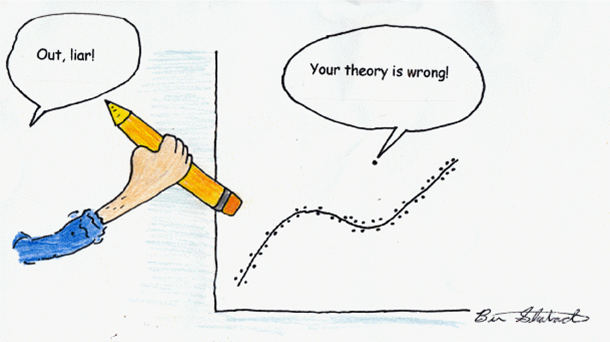

In [6]:
thresh = 0.3
diff_lat = abs(df['start_lat'] - df['end_lat'])
diff_lon = abs(df['start_lng'] - df['end_lng'])

mask = (diff_lat < thresh) & (diff_lon < thresh)
df = df[mask]

print('Removed:', (~mask).sum())

Removed: 3398


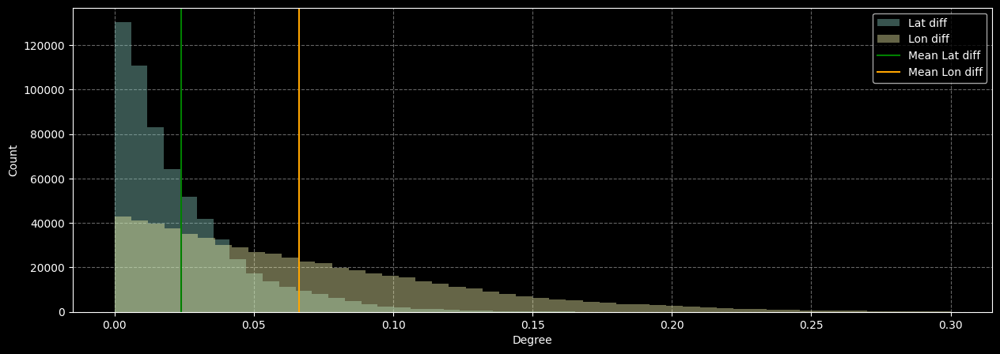

In [7]:
fig, ax = get_subplots((15, 5), 1, 1)

diff_lat = abs(df['start_lat'] - df['end_lat'])
diff_lon = abs(df['start_lng'] - df['end_lng'])
mean_diff_lat = diff_lat.mean() 
mean_diff_lon = diff_lon.mean() 

sns.distplot(diff_lat, ax=ax, kde=False, label='Lat diff')
sns.distplot(diff_lon, ax=ax, kde=False, label='Lon diff')
ax.axvline(mean_diff_lat, color='green', label='Mean Lat diff')
ax.axvline(mean_diff_lon, color='orange', label='Mean Lon diff')

ax.set_ylabel('Count')
ax.set_xlabel('Degree')

ax.legend();

## Time grouping

The analysis will be separed on 3 main categories as a certain seasonality is expected:
- all-time
- workdays / weekdays
- weekend

In [8]:
workday_df = df[(np.isin(df['start_time'].dt.weekday, [i for i in range(5)]))].copy()
weekend_df = df[(np.isin(df['start_time'].dt.weekday, [i for i in range(5,7)]))].copy()

# Feature analysis 🔍 <a name="feature" />
---

In [9]:
def plot_seasonal_decomp(seasonal_decomp, ax, plot_residual=True):
    """Utility method use for plotting seasonal decomposition"""
    
    ax.plot(seasonal_decomp.trend, label='Trend')
    ax.plot(seasonal_decomp.seasonal, label='Seasonal')
    ax.plot(seasonal_decomp.trend + seasonal_decomp.seasonal, label='Reconstruction')
    ax.plot(seasonal_decomp.observed, label='Observed')
    
    if plot_residual:
        ax.plot(seasonal_decomp.resid, label='Resid')
    
    ax.legend()
    ax.set_ylabel('Unit [count]')
    ax.set_xlabel('Date [1d]')
    return ax

## 1. Ride value distribution

**What do we see?** 🧐
   - the average value of a trip grouped per seasonality
    
**Interpretation** 💡
   -  in weekend, while the order density remains roughly the same, the average values increases (denoted by a flatted distribution). 

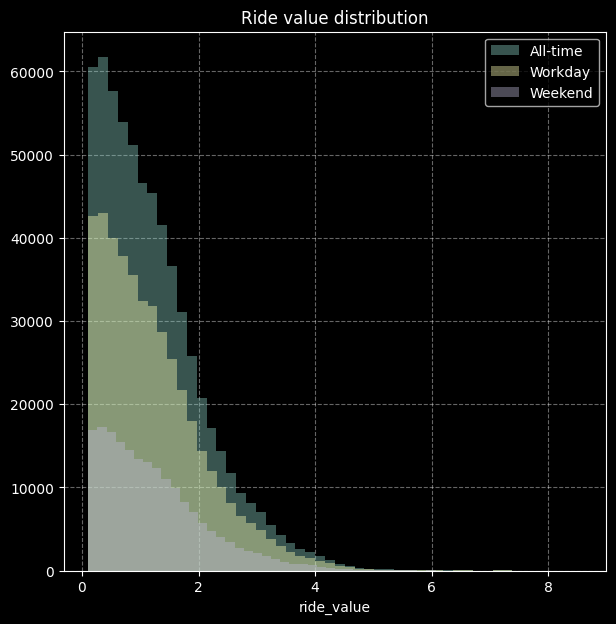

In [10]:
fig, ax = get_subplots()

sns.distplot(df['ride_value'],         kde=False, ax=ax, label='All-time')
sns.distplot(workday_df['ride_value'], kde=False, ax=ax, label='Workday')
sns.distplot(weekend_df['ride_value'], kde=False, ax=ax, label='Weekend')

ax.set_title('Ride value distribution')
ax.legend();

## 2. Trip length

**What do we see?**🧐
   - the average trip length as computed on the surface of the earth (not road distance)  
    
**Interpretation**💡
   - the vast majority of the trips have a length of roughly 2.5km, with an average mean of 5 km
   
**Observation** 🤔
   - while longer rides bring more money in, it blocks the driver for a longer period of time
   - the monetary values is not necessarly the soul metric to optimize, but rather a balance between number of orders and monetary value

<div class="alert alert-block alert-warning">
    <b>Remember:</b> noisy trips have beed discarded in the preprocessing step 👆
</div>

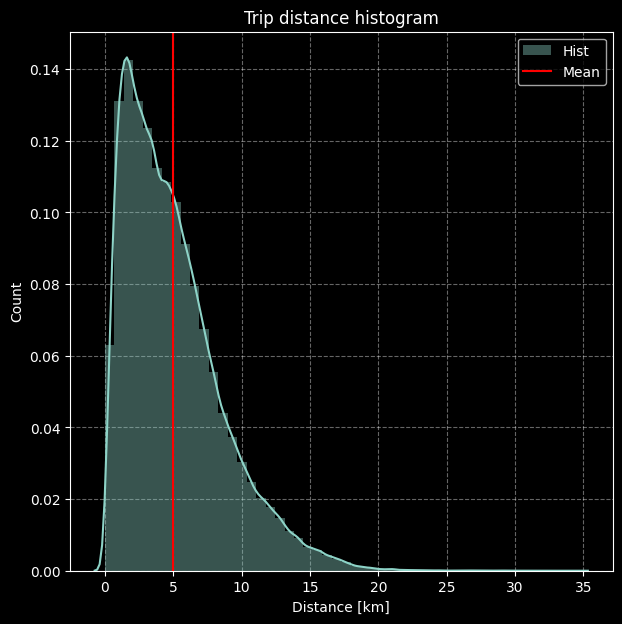

In [11]:
fig, ax = get_subplots()

sns.distplot(df['ride_distance'], kde=True, ax=ax, label='Hist')
ax.axvline(df['ride_distance'].mean(), label='Mean', color='red')

ax.set_ylabel('Count')
ax.set_xlabel('Distance [km]')

ax.set_title('Trip distance histogram')
ax.legend();

## 3. Trip length/value correlation

**What do we see?** 🧐
   - ride distance and ride value plotted one against another
    
**Interpretation** 💡
   -  there is a strongly linear correlation between the 2;


<div class="alert alert-block alert-info">
    <b>Interesting:</b>  while in the description, <b>ride_value</b>💸  was described as *how much monetary value is in this particular ride*, the data reveals that it's rather how much is taxed for a ride, and does not include the items value (i.e. food) 
</div>

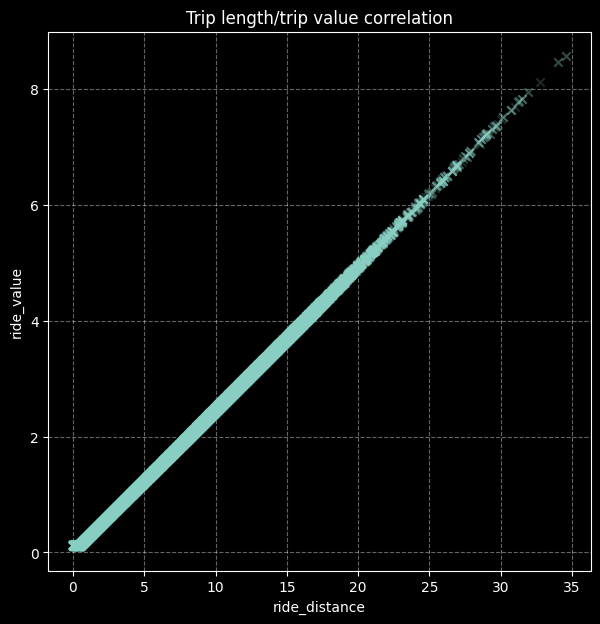

In [12]:
fig, ax = get_subplots()

ax.scatter(x=df['ride_distance'], y=df['ride_value'], marker='x', alpha=0.2)
ax.set_xlabel('ride_distance');
ax.set_ylabel('ride_value')
ax.set_title('Trip length/trip value correlation');

In [13]:
print('Linear correlation:')
np.corrcoef(df['ride_distance'], df['ride_value']) 

Linear correlation:


array([[1.        , 0.99989661],
       [0.99989661, 1.        ]])

## 4. Revenue per day 

**What do we see?** 🧐
   - the decomposition of the total revenue in trend and seasonality
   - ```freq = 1 day```
    
**Interpretation** 💡
   - it can be see that decomposition works very well, the trend is sligtly increasing from week to week and the seasonality seems very similar for every week


<div class="alert alert-block alert-danger">
    🚨 <b>Synthethic data detected</b> 🚨 Decomposing the total revenue using trend-seasonality technique works wonderful. 
</div>

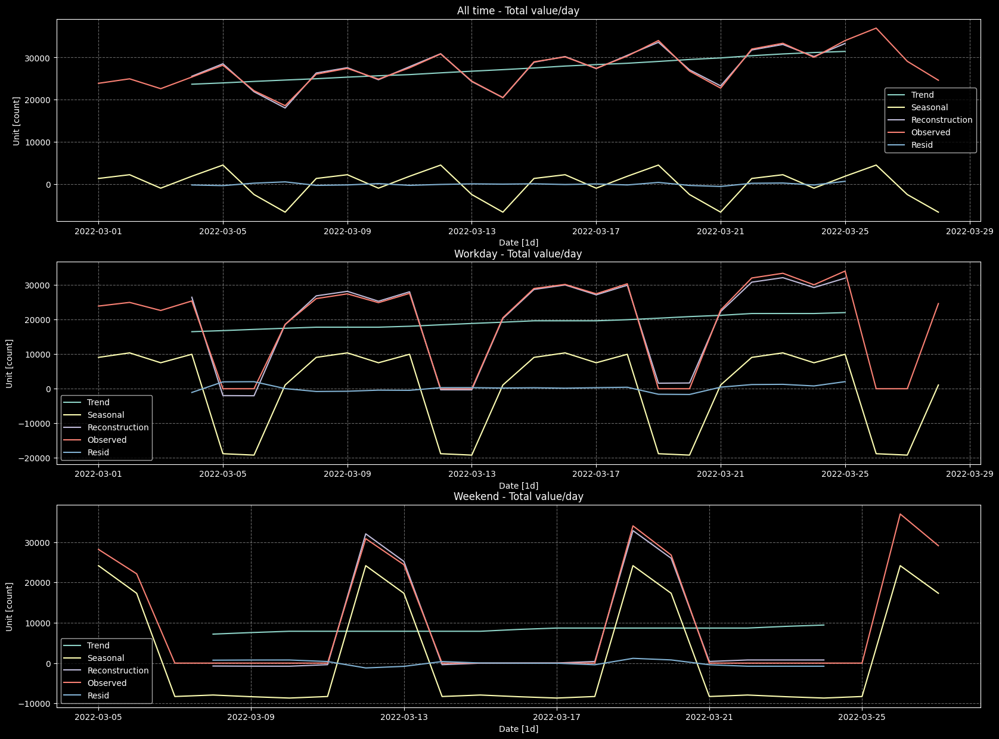

In [14]:
fig, ax = get_subplots((20, 15), 1, 3)

for i, group in enumerate([df, workday_df,weekend_df]):
    ride = group.groupby(pd.Grouper(key='start_time', freq='1d')).sum()['ride_value']
    seasonal_decomp = seasonal_decompose(ride, model='additive')
    plot_seasonal_decomp(seasonal_decomp, ax[i], True)
    
ax[0].set_title('All time - Total value/day')
ax[1].set_title('Workday - Total value/day')
ax[2].set_title('Weekend - Total value/day');

## 5. Revenue per hour

**What do we see?** 🧐
   - the decomposition of the total revenue/hour in trend and seasonality
   - ```freq = 1 hour```
   
**Interpretation** 💡
   - it can be see that decomposition work very well except for when the service is shut down during the night, hence there is no seasonality 
   - ```3 notable spikes```  can be seed during weekdays, (probably representing the main meals)

<div class="alert alert-block alert-warning">
     <b>Observation</b> during weekend, while the certain surges can be predicted, their magnitude can not => irregularity 🤨
</div>

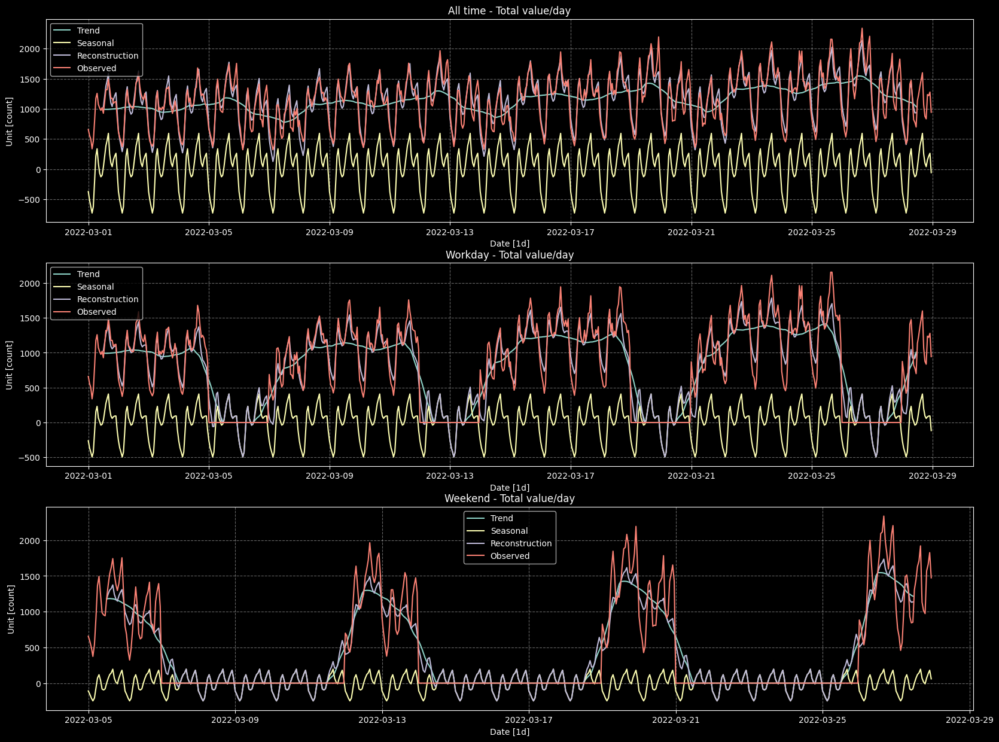

In [15]:
# decompose revenue in trend and seasonality - freq 1 day
fig, ax = get_subplots((20, 15), 1, 3)

for i, group in enumerate([df, workday_df,weekend_df]):
    ride = group.groupby(pd.Grouper(key='start_time', freq='1h')).sum()['ride_value']
    seasonal_decomp = seasonal_decompose(ride, model='additive')
    plot_seasonal_decomp(seasonal_decomp, ax[i], False)
    
ax[0].set_title('All time - Total value/day')
ax[1].set_title('Workday - Total value/day')
ax[2].set_title('Weekend - Total value/day');

## 6. Order count per day

**What do we see?** 🧐
   - the decomposition of the total order count in trend and seasonality
   - ```freq=1day```
   
**Interpretation** 💡
   - similar observations as before ♻️

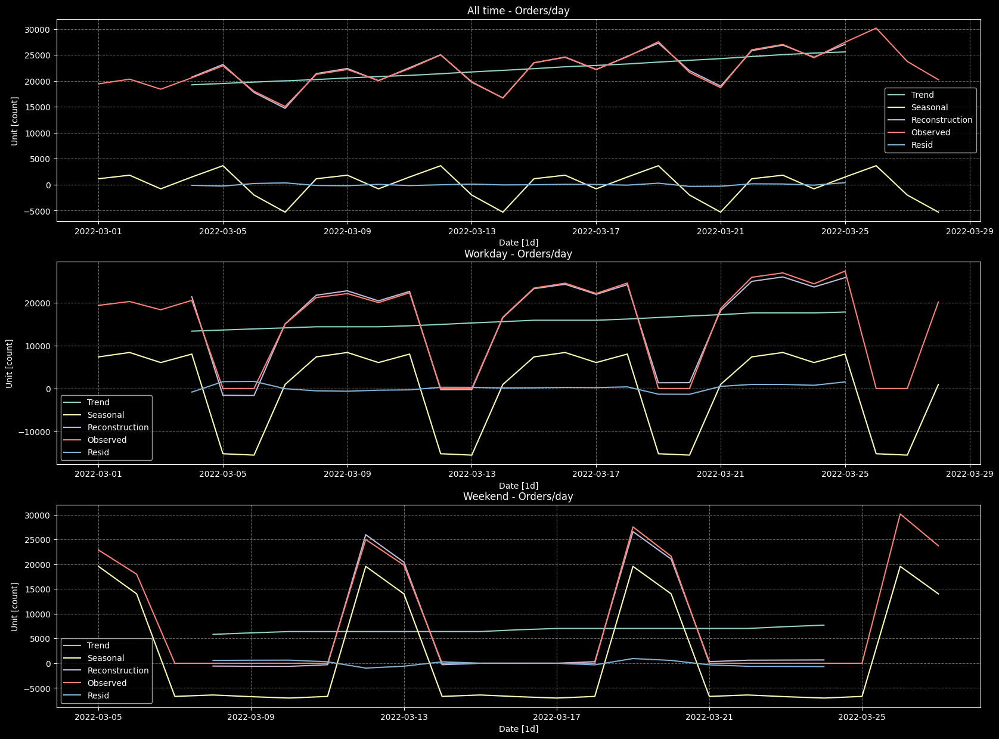

In [16]:
fig, ax = get_subplots((20, 15), 1, 3)

for i, group in enumerate([df, workday_df,weekend_df]):
    ride = group.groupby(pd.Grouper(key='start_time', freq='1d')).count()['ride_value']
    seasonal_decomp = seasonal_decompose(ride, model='additive')
    plot_seasonal_decomp(seasonal_decomp, ax[i], True)
    
ax[0].set_title('All time - Orders/day')
ax[1].set_title('Workday - Orders/day')
ax[2].set_title('Weekend - Orders/day');

## 7. Order count per hour

**What do we see?** 🧐
   - the decomposition of the total order count/hour in trend and seasonality
    
**Interpretation**💡
   - it can be see that decomposition works well for weekdays
   - the seasonality can not be modeled during weekend where certain spikes can arise  (suddenly the number of orders is increased)

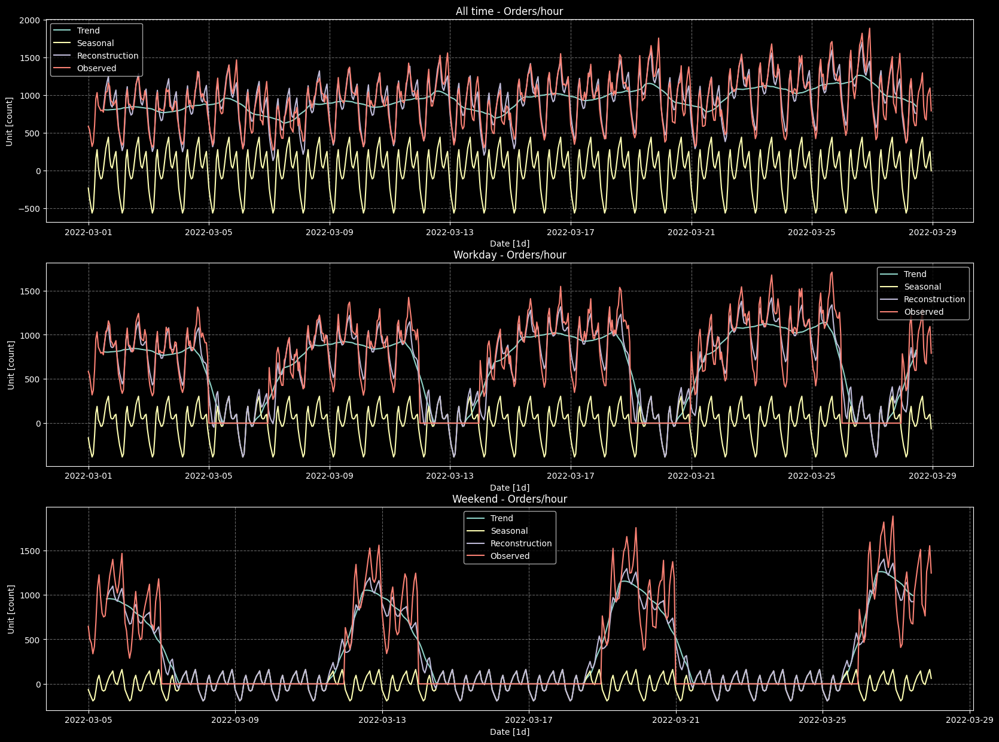

In [17]:
fig, ax = get_subplots((20, 15), 1, 3)

for i, group in enumerate([df, workday_df,weekend_df]):
    ride = group.groupby(pd.Grouper(key='start_time', freq='1h')).count()['ride_value']
    seasonal_decomp = seasonal_decompose(ride, model='additive')
    plot_seasonal_decomp(seasonal_decomp, ax[i], False)
    
ax[0].set_title('All time - Orders/hour')
ax[1].set_title('Workday - Orders/hour')
ax[2].set_title('Weekend - Orders/hour');

# Geospacial analysis 🧭 <a name="geospacial" />
---

The coordinates are grouped based on Uber's [H3](https://eng.uber.com/h3/) hexanons. 

<div class="alert alert-block alert-danger">
<b>Bug:</b> 🪲 some Bokeh figures might appear to have no map, just hover over them and darg the figure a little and the map should appear. 
</div>

## 1. Supply - restaurants

**What do we see?** 🧐
   - number of total orders picked up from a region in a day 
   - regions with the more orders are darker, the regions will less orders are brighter
   - freq = 1 day
   
**Interpretation** 💡
   - people tend to orderd sligtly more from marginal restaurants rather than central restaurants during weekend

<div class="alert alert-block alert-warning">
<b>Important:</b> the actual range is printed and not present on ColorBar
</div>

In [18]:
figs = []

for i, (group, title) in enumerate(zip([df, workday_df,weekend_df], ['All time', 'Weekdays', 'Weekend'])):
    ride = group.groupby('hex_start').count()['ride_value']
    hexs = ride.index.values.tolist()
    
    # get perecntiles form first statistics
    if i == 0:
        percentile = ride.quantile([i/10 for i in range(0,11,1)])
        print("Actual range", percentile.tolist())
    rides = pd.cut(ride, percentile, labels=[i for i in range(10)])
    rides = rides.fillna(0)
    
    fig = visualize_hexagons(hexs, rides)
    fig.title.text = title + ' - supply'
    figs.append(fig)

show(row(*figs))

Actual range [3.0, 16.1, 28.60000000000001, 55.79999999999998, 184.00000000000003, 436.0, 675.5999999999997, 1725.4999999999975, 4640.800000000004, 16306.300000000003, 176036.0]


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

## 2. Demand - delivery

**What do we see?** 🧐
   - number of total orders delivered to a region / day
   - regions with the more orders are darker, the regions will less orders are brighter
   
**Interpretation** 💡
   - during weekdays, more orders are delivered in the central area, while during weekend more orders are delivered in more periferic regions

<div class="alert alert-block alert-warning">
<b>Important:</b> the actual range is printed and not present on ColorBar
</div>

In [19]:
figs = []

for i, (group, title) in enumerate(zip([df, workday_df,weekend_df], ['All time', 'Weekdays', 'Weekend'])):
    ride = group.groupby('hex_end').count()['ride_value']
    hexs = ride.index.values.tolist()
    
    # get perecntiles form first statistics
    if i == 0:
        percentile = ride.quantile([i/10 for i in range(0,11,1)])
        print("Actual range", percentile.tolist())
        
    rides = pd.cut(ride, percentile, labels=[i for i in range(10)])
    rides = rides.fillna(0)
    
    fig = visualize_hexagons(hexs, rides)
    fig.title.text = title + ' - demand'
    figs.append(fig)
    

show(row(*figs))

Actual range [1.0, 3.0, 8.600000000000001, 12.899999999999991, 28.200000000000003, 52.5, 143.7999999999998, 299.6999999999998, 776.2, 4757.000000000005, 149745.0]


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

## 3. Supply-demand gap

**What do we see?** 🧐
   - the difference between no orders picked-up from and delivered to a region / day - displayed per timespan
   - regions where there would be a deficit of drivers are darker, the regions where there will be a surplus of drivers are brighter
   
**Interpretation** 💡
   - there is a tendancy that in central areas there will be a deficit, and in perific regions will be a surplus.
   - for the system to be in equilibrium the gap between the 2 values should be narrowed as much as possible => reroute driver to the nearest hex in need for drivers

<div class="alert alert-block alert-warning">
<b>Important:</b> You guessed it right, as mentioned before, the actual range is printed and not present on ColorBar
</div>

In [20]:
figs = []

for i, (group, title) in enumerate(zip([df, workday_df,weekend_df], ['All time', 'Weekdays', 'Weekend'])):
    supply = group.groupby('hex_start').count()
    demand = group.groupby('hex_end').count()
    market = supply.join(demand, lsuffix='_supply', how= 'outer').fillna(0)
    gap = market['ride_value_supply'] - market['ride_value']
    
    if i == 0:
        percentile = gap.quantile([i/10 for i in range(0,11,1)])
        print("Actual range", percentile.tolist())
    gap = pd.cut(gap, percentile, labels=[i for i in range(10)])
    gap = gap.fillna(0)
     
    fig = visualize_hexagons(gap.index, gap)
    fig.title.text = title + ' - absolute supply/demand gap'
    figs.append(fig)

show(row(*figs))

Actual range [-6325.0, -475.0, -213.0, -102.5, -53.0, -29.5, -15.0, -9.0, -5.0, -1.0, 26291.0]


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

## 4. Average daily pick-up value

**What do we see?** 🧐
   - the average value picked up from a region  / day - displayed per timespan
   - think of this more likely as production capacity
   
**Interpretation** 💡
   - central area produces the most value /per hour (the most expensive orders are picked from here)
   - during weekend, orders from central locations drop (probably more people go to the actual restaurant rather than ordering from there)

<div class="alert alert-block alert-warning">
<b>Important:</b> the actual range is printed and not present on ColorBar
</div>

In [21]:
figs = []

for i, (group, title) in enumerate(zip([df, workday_df,weekend_df], ['All time', 'Weekdays', 'Weekend'])):
    hex_earning = group.groupby(['hex_start', pd.Grouper(key='start_time', freq='1d')]).sum().drop(columns=['hex_end']).groupby('hex_start').mean()
    hex_earning = hex_earning['ride_value']
    hexs = hex_earning.index.values.tolist()
    
    # get perecntiles form first statistics
    if i == 0:
        percentile = hex_earning.quantile([i/10 for i in range(0,11,1)])
        print("Actual range", percentile.tolist())
        
    hex_earning = pd.cut(hex_earning, percentile, labels=[i for i in range(10)])
    hex_earning = hex_earning.fillna(0)
    
    fig = visualize_hexagons(hexs, hex_earning)
    fig.title.text = title + ' - average daily pickup value'
    figs.append(fig)
    
show(row(*figs))

Actual range [1.7119975093933002, 3.902880668445888, 4.656870351168996, 6.85532416876571, 15.995114674098977, 37.528001802506544, 61.07418450186255, 120.50706117536902, 312.27089184574396, 832.191940069955, 5790.719720760767]


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

## 5. Average hourly pick-up volume

**What do we see?** 🧐
   - the average volume picked um from a region  / day
   
**Interpretation** 💡
   - most orders are picked up from a central area
   - during weekend, orders from central locations drop (behaviour correlated with the picked-up value)

<div class="alert alert-block alert-warning">
<b>Important:</b> the actual range is printed and not present on ColorBar
</div>

In [22]:
figs = []

for i, (group, title) in enumerate(zip([df, workday_df,weekend_df], ['All time', 'Weekdays', 'Weekend'])):
    hex_earning = group.groupby(['hex_start', pd.Grouper(key='start_time', freq='1d')]).count().groupby('hex_start').mean()
    hex_earning = hex_earning['ride_value']
    hexs = hex_earning.index.values.tolist()
    
    # get perecntiles form first statistics
    if i == 0:
        percentile = hex_earning.quantile([i/10 for i in range(0,11,1)])
        print("Actual range", percentile.tolist())
        
    hex_earning = pd.cut(hex_earning, percentile, labels=[i for i in range(10)])
    hex_earning = hex_earning.fillna(0)
    
    fig = visualize_hexagons(hexs, hex_earning)
    fig.title.text = title + ' - average pickup volume'
    figs.append(fig)
    
show(row(*figs))

Actual range [1.0, 1.3102564102564103, 1.6285714285714288, 2.36025641025641, 6.571428571428573, 15.57142857142857, 24.12857142857142, 61.624999999999915, 165.7428571428573, 582.3678571428572, 6287.0]


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

## 6. Average daily delivery value

**What do we see?** 🧐
   - the average value delivered to region  / day - displayed per timespan
   - think of this more likely to as consumer
   
**Interpretation** 💡
   - periferic regions tend to consume more in the weekend (indicating residential areas)
   - in some semi-central regions(i.e near the sea) a decrease in delivered value can be observed during weekend => an office area

<div class="alert alert-block alert-warning">
<b>Important:</b> the actual range is printed and not present on ColorBar
</div>

In [23]:
figs = []

for i, (group, title) in enumerate(zip([df, workday_df,weekend_df], ['All time', 'Weekdays', 'Weekend'])):
    hex_earning = group.groupby(['hex_end', pd.Grouper(key='start_time', freq='1d')]).sum().drop(columns=['hex_start']).groupby('hex_end').mean()
    hex_earning = hex_earning['ride_value']
    hexs = hex_earning.index.values.tolist()
    
    # get perecntiles form first statistics
    if i == 0:
        percentile = hex_earning.quantile([i/10 for i in range(0,11,1)])
        print("Actual range", percentile.tolist())
        
    hex_earning = pd.cut(hex_earning, percentile, labels=[i for i in range(10)])
    hex_earning = hex_earning.fillna(0)
    
    fig = visualize_hexagons(hexs, hex_earning)
    fig.title.text = title + ' - average delivery value'
    figs.append(fig)
    
show(row(*figs))

Actual range [1.50465, 4.023086623649481, 4.700414430416841, 5.927464067550649, 6.758745454545455, 8.299615728044554, 14.843172695054301, 30.483192993271228, 80.83405216520714, 336.85550238704604, 4339.284404433015]


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

## 7. Average daily delivery volume

**What do we see?**
   - the average volume delivered to a region  / day
   
**Interpretation**
   - most orders are delivered to central and semi-central areas
   - during workdays, we can see certain regions in the suburbs (such as Keila) where the volume is increased -> an industrial area

<div class="alert alert-block alert-warning">
<b>Important:</b> the actual range is printed and not present on ColorBar
</div>

In [24]:
figs = []

for i, (group, title) in enumerate(zip([df, workday_df,weekend_df], ['All time', 'Weekdays', 'Weekend'])):
    hex_earning = group.groupby(['hex_end', pd.Grouper(key='start_time', freq='1d')]).count().groupby('hex_end').mean()
    hex_earning = hex_earning['ride_value']
    hexs = hex_earning.index.values.tolist()
    
    # get perecntiles form first statistics
    if i == 0:
        percentile = hex_earning.quantile([i/10 for i in range(0,11,2)])
        print("Actual range", percentile.tolist())
        
    hex_earning = pd.cut(hex_earning, percentile, labels=[i for i in range(5)])
    hex_earning = hex_earning.fillna(0)
    
    fig = visualize_hexagons(hexs, hex_earning)
    fig.title.text = title + ' - average delivery volume'
    figs.append(fig)
    
show(row(*figs))

Actual range [1.0, 1.0853146853146853, 1.6222222222222225, 5.285714285714279, 27.721428571428575, 5348.035714285715]


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

# Baseline model 🔮 <a name="baseline" />
---

Thr following approach was chose as a baseline:

1. Split data into regions (hex) on a per-hour basis
2. Compute supply per region
3. Split data: keep 3 weeks for training and 1 for predicting
3. Train a model (Prophet) per region for each feature  (supply / demand / gap)
4. Evaluate per region on the test data

## 1. Data preparation

Prepare data for training and create aditional features (ended up not using them, however kept them for future work🔮).

- **supply** - the number of pick-up orders in a Hex
- ~~**demand** - the number of deliverd to a Hex~~
- ~~**value_in** - the total value leaving a Hex~~
- ~~**value_out** - the total value that comes into a Hex~~
- ~~**km_in** - average trip length of a ride entering a Hex~~
- ~~**km_out** - average trip length of a ride leaving a Hex~~

<div class="alert alert-block alert-info">
    <b>Note:</b> Note, missing periods on a Hex would imply a value of 0 for all columns, however this replacement will be only happen at train time. 
</div>

In [25]:
def prepare_for_training(orig_df):
    ''' Create aggregate features and prepare data for training grouping by hex and tyme'''
    feat_df = orig_df.copy()
    
    grouper = pd.Grouper(key='start_time', freq='1h')

    supply    = feat_df.groupby(['hex_start', grouper]).count()[['hex_end']].rename(columns={'hex_end':'supply'})
    demand    = feat_df.groupby(['hex_end',   grouper]).count()[['hex_start']].rename(columns={'hex_start':'demand'})
    value_in  = feat_df.groupby(['hex_end',   grouper]).sum()[['ride_value']].rename(columns={'ride_value':'value_in'})
    value_out = feat_df.groupby(['hex_start', grouper]).sum()[['ride_value']].rename(columns={'ride_value':'value_out'})
    km_in     = feat_df.groupby(['hex_end',   grouper])[['ride_distance']].mean().rename(columns={'ride_distance':'km_in'})
    km_out    = feat_df.groupby(['hex_start', grouper])[['ride_distance']].mean().rename(columns={'ride_distance':'km_out'})
    
    container = pd.concat([supply, demand, value_in, value_out, km_in, km_out], axis=1)
    container = container
    container['gap'] = container['supply'] - container['demand']

    return container


In [26]:
container = prepare_for_training(df)
container.head()

supply  demand  value_in  value_out  \
                start_time                                                 
87089b014ffffff 2022-03-01 07:00:00     1.0     NaN       NaN    3.28600   
                2022-03-01 09:00:00     1.0     NaN       NaN    4.58300   
                2022-03-01 18:00:00     1.0     NaN       NaN    2.52025   
                2022-03-02 02:00:00     1.0     NaN       NaN    4.56650   
                2022-03-03 01:00:00     1.0     NaN       NaN    5.49475   

                                     km_in     km_out  gap  
                start_time                                  
87089b014ffffff 2022-03-01 07:00:00    NaN  13.275026  NaN  
                2022-03-01 09:00:00    NaN  18.510156  NaN  
                2022-03-01 18:00:00    NaN  10.155779  NaN  
                2022-03-02 02:00:00    NaN  18.487852  NaN  
                2022-03-03 01:00:00    NaN  22.244767  NaN

## 2. Split train/test

Data will be split 🔪 per week as follows:
   - **training:** 9, 10, 11
   - **testing:** 12, 13 (has very few samples)

In [27]:
print("Start date:     ", df.reset_index().start_time.min())
print("End data:       ", df.reset_index().start_time.max())
print("Weekly samples: ", df.reset_index().start_time.dt.isocalendar().week.value_counts().to_dict())

Start date:      2022-03-01 00:00:07.936317
End data:        2022-03-28 23:59:53.175658
Weekly samples:  {12: 177478, 11: 160774, 10: 145746, 9: 119594, 13: 20220}


In [28]:
def get_time_range(container, train_until_week_no=12):
    start_time = container.reset_index()['start_time'].min().round('1h')
    end_time = container.reset_index()['start_time'].max().round('1h')
    
    dt_range = pd.date_range(start=start_time, 
                              end=end_time, 
                              periods=None, 
                              freq='1h')
    train_mask = pd.Series(dt_range).dt.isocalendar().week < train_until_week_no
    test_mask = ~train_mask
    
    return dt_range, train_mask, test_mask

In [29]:
dt_range, train_mask, test_mask = get_time_range(container, train_until_week_no=12)
print('Total number of timesteps: ', dt_range.shape[0])
print('Train timesteps: ', dt_range[train_mask].shape[0])
print('Test timesteps: ', dt_range[test_mask].shape[0])

Total number of timesteps:  672
Train timesteps:  480
Test timesteps:  192


## 3. Train models

For this taks an autoregressive model will be used. 
Chosen model: [Prophet](https://peerj.com/preprints/3190/)

**Advantages:**
- easy to use
- fast to train an relatively reliable
- can model seasonality
- does not require much data to train

**Disadvantages:**
- univariate model, does not take into consideration aditional features => a lot of heteroscedastic uncertainty
- hyperparameter sensitive

In [30]:
from prophet import Prophet

Importing plotly failed. Interactive plots will not work.


In [31]:
def train_arima(container, target_col='supply', filt_thresh=200):
    hexes = container.reset_index()['level_0'].unique()
    
    res_dict = {} 
    for hex_ in tqdm(hexes):
        temp_df = container.loc[hex_]
        
        # filter based of number of samples
        if len(temp_df) < filt_thresh:
            continue
        
        temp_df  = temp_df.reindex(dt_range).fillna(0)
        train_series = temp_df[target_col].loc[dt_range[train_mask]]
        test_series  = temp_df[target_col].loc[dt_range[test_mask]]        
        
        train_df = pd.DataFrame()
        train_df['y'] = train_series
        train_df['ds'] = dt_range[train_mask]
        
        model = Prophet(yearly_seasonality=False, 
                        holidays=None,
                        changepoints=None,
                        n_changepoints=30,
                        changepoint_range=0.9,
                        changepoint_prior_scale=1.9 # increase trend flexibility
                       )
        
        model = model.fit(train_df)        
        
        res_dict[hex_] = {'model':model, 'train_series':train_series, 'test_series':test_series}

    return res_dict

In [32]:
supply_models = train_arima(container, target_col='supply', filt_thresh=200)
# demand_models = train_arima(container, target_col='demand', filt_thresh=200)
# gap_models    = train_arima(container, target_col='gap',    filt_thresh=200)

  0%|          | 0/236 [00:00<?, ?it/s]

11:54:19 - cmdstanpy - INFO - Chain [1] start processing
11:54:19 - cmdstanpy - INFO - Chain [1] done processing
11:54:19 - cmdstanpy - INFO - Chain [1] start processing
11:54:19 - cmdstanpy - INFO - Chain [1] done processing
11:54:19 - cmdstanpy - INFO - Chain [1] start processing
11:54:19 - cmdstanpy - INFO - Chain [1] done processing
11:54:19 - cmdstanpy - INFO - Chain [1] start processing
11:54:19 - cmdstanpy - INFO - Chain [1] done processing
11:54:20 - cmdstanpy - INFO - Chain [1] start processing
11:54:20 - cmdstanpy - INFO - Chain [1] done processing
11:54:20 - cmdstanpy - INFO - Chain [1] start processing
11:54:20 - cmdstanpy - INFO - Chain [1] done processing
11:54:20 - cmdstanpy - INFO - Chain [1] start processing
11:54:20 - cmdstanpy - INFO - Chain [1] done processing
11:54:20 - cmdstanpy - INFO - Chain [1] start processing
11:54:20 - cmdstanpy - INFO - Chain [1] done processing
11:54:20 - cmdstanpy - INFO - Chain [1] start processing
11:54:20 - cmdstanpy - INFO - Chain [1]

In [33]:
print('Supply - succesfully predicted: ',  len(list(supply_models.keys())))
# print('Gap    - succesfully predicted: ',  len(list(gap_models.keys())))
# print('Demand - succesfully predicted: ',  len(list(demand_models.keys())))

Supply - succesfully predicted:  84


## 4. Sample predictions

This section allows one to visualize predictions for different regions.

Utility function for viewing hex: [https://wolf-h3-viewer.glitch.me/](https://wolf-h3-viewer.glitch.me/)

In [34]:
hex_ = '87089b1a6ffffff' # Talinn semi-centeral

model        = supply_models[hex_]['model']
train_series = supply_models[hex_]['train_series']
test_series  = supply_models[hex_]['test_series']

In [35]:
train_pred = model.predict()
test_pred = model.predict(pd.DataFrame(dt_range[test_mask], columns=['ds']))

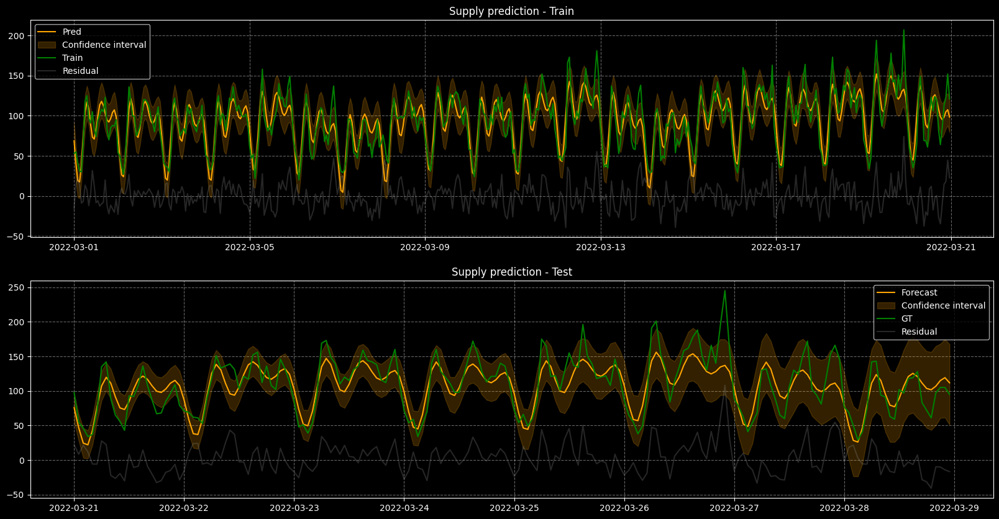

In [36]:
fig, ax = get_subplots((20, 10), 1, 2)

ax[0].plot(dt_range[train_mask], train_pred.yhat, label='Pred', color='orange')
ax[0].fill_between(dt_range[train_mask], y1=train_pred.yhat_lower, y2=train_pred.yhat_upper, alpha=0.2, label='Confidence interval', color='orange')
ax[0].plot(dt_range[train_mask], train_series, label='Train', color='green')
ax[0].plot(dt_range[train_mask], train_series.values-train_pred.yhat, label='Residual', color='gray', alpha=0.3)
ax[0].set_title('Supply prediction - Train')
ax[0].legend()

ax[1].plot(dt_range[test_mask], test_pred.yhat, label='Forecast', color='orange')
ax[1].fill_between(dt_range[test_mask], y1=test_pred.yhat_lower, y2=test_pred.yhat_upper, alpha=0.2, label='Confidence interval', color='orange')
ax[1].plot(dt_range[test_mask], test_series, label='GT', color='green')
ax[1].plot(dt_range[test_mask], test_series.values-test_pred.yhat, label='Residual', color='gray', alpha=0.3)
ax[1].set_title('Supply prediction - Test')
ax[1].legend()

## 5. Sample error analysis

The error will be analised per hex.

Errors and their meaning:
   - **MAE** - mean absolute error between the predicted value and GT - get a glipse over how off the model is 
   - **Accuracy** - a correct prediction implied that GT lies within the confidence interval 
   - **False Negative** - model predicted below the actual number of orders
   - **False Positive** - model predicted over the actual number of orders

In [37]:
mae_list_train = []
mae_list_test  = []

acc_list_train = []
acc_list_test  = []

fn_list_train = []
fn_list_test  = []

fp_list_train = []
fp_list_test  = []

hex_list = []

for i, (hex_, res_dict) in tqdm(enumerate(supply_models.items())):
    
    model        = res_dict['model']
    train_series = res_dict['train_series']
    test_series  = res_dict['test_series']
    
    # predict
    train_pred = model.predict()
    test_pred  = model.predict(pd.DataFrame(dt_range[test_mask], columns=['ds']))
    
    # MAE 
    mae_list_train.append(abs(train_series.values-train_pred.yhat).mean())
    mae_list_test.append(abs(test_series.values-test_pred.yhat).mean())
    
    # Accuracy - value in confidence interval
    acc_list_train.append(((train_pred.yhat_lower < train_series.values) & (train_series.values < train_pred.yhat_upper)).sum() / len(train_pred))
    acc_list_test.append(((test_pred.yhat_lower < test_series.values) & (test_series.values < test_pred.yhat_upper)).sum() / len(test_pred))

    # False negative
    fn_list_train.append((train_pred.yhat_lower < train_series.values).sum() / len(train_pred))
    fn_list_test.append((test_pred.yhat_lower  < test_series.values).sum() / len(test_pred))
    
    # False positive
    fp_list_train.append((train_pred.yhat_upper < train_series.values).sum() / len(train_pred))
    fp_list_test.append((test_pred.yhat_upper < test_series.values).sum() / len(test_pred))
    
    hex_list.append(hex_)        

0it [00:00, ?it/s]

In [38]:
mae_train = np.array(mae_list_train)
mae_test  = np.array(mae_list_test)

acc_train = np.array(acc_list_train)
acc_test  = np.array(acc_list_test)

fn_train = np.array(fn_list_train)
fn_test  = np.array(fn_list_test)

fp_train = np.array(fp_list_train)
fp_test  = np.array(fp_list_test)

### 5.1 Mean absolute error

**How to interpret:** 🧐
- lower is better
- mean absolute error between the predicted value and GT 

**Interpretation** 💡
- get a glipse over the error magnitude 
- long tail for test split 😭, though, the prediction time is a week (can be considered a large time span for our application)

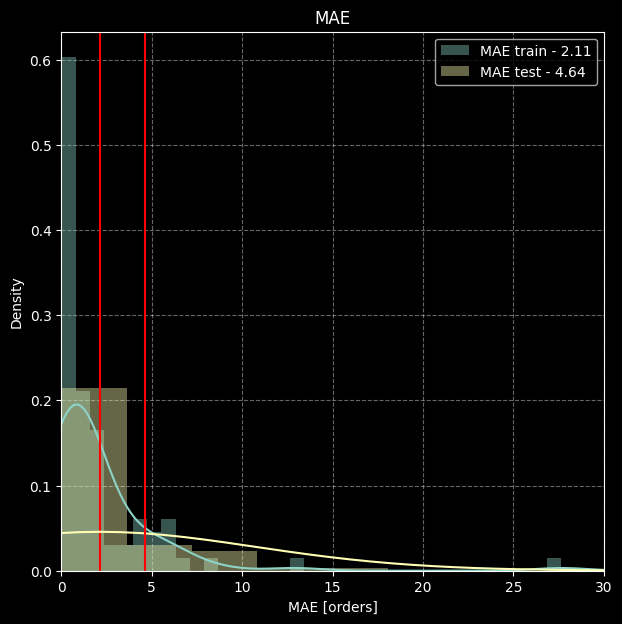

In [39]:
fig, ax = get_subplots()

sns.distplot(mae_train, ax=ax, label=f'MAE train - {mae_train.mean():2.2f}')
ax.axvline(mae_train.mean(), color='red')
sns.distplot(mae_test, ax=ax, label=f'MAE test - {mae_test.mean():2.2f}')
ax.axvline(mae_test.mean(), color='red')

ax.set_xlim([0, 30])
ax.set_xlabel('MAE [orders]')
ax.set_ylabel('Density')
ax.set_title('MAE')
ax.legend()

### 5.2 Accuracy

**How to interpret:** 🧐
- higher is better
- a correct prediction implied that GT lies within the confidence interval 

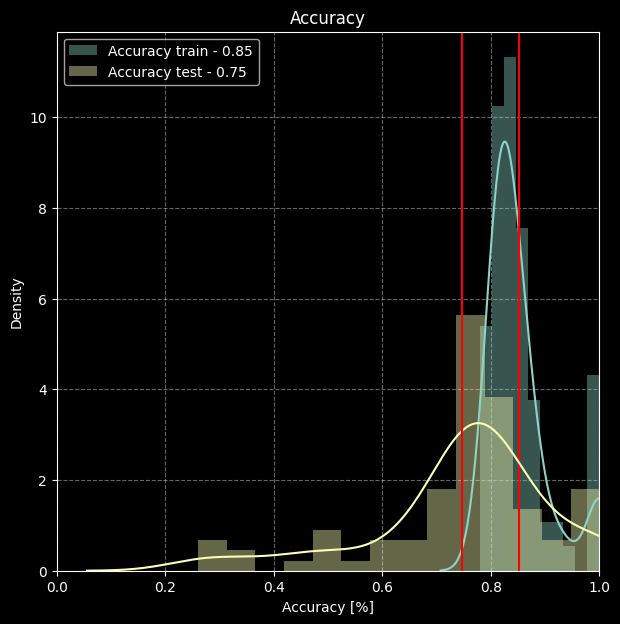

In [40]:
fig, ax = get_subplots()

sns.distplot(acc_train, ax=ax, label=f'Accuracy train - {acc_train.mean():2.2f}')
ax.axvline(acc_train.mean(), color='red')
sns.distplot(acc_test, ax=ax, label=f'Accuracy test - {acc_test.mean():2.2f}')
ax.axvline(acc_test.mean(), color='red')

ax.set_xlim([0, 1])
ax.set_xlabel('Accuracy [%]')
ax.set_ylabel('Density')
ax.set_title('Accuracy')
ax.legend()

### 5.3 False negative rate

**How to interpret:** 🧐
- lower is better
- how many predictions are below the confidence interval
- these are very important hence we have to predict crowded areas, and a failure to predict means there might not be enough drivers 

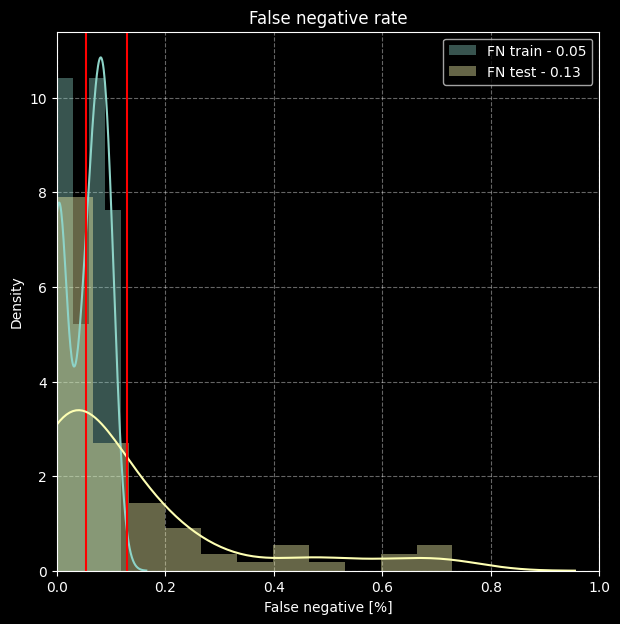

In [41]:
fig, ax = get_subplots()

sns.distplot(1-fn_train, ax=ax, label=f'FN train - {1-fn_train.mean():2.2f}')
ax.axvline(1-fn_train.mean(), color='red')
sns.distplot(1-fn_test, ax=ax, label=f'FN test - {1-fn_test.mean():2.2f}')
ax.axvline(1-fn_test.mean(), color='red')

ax.set_xlim([0, 1])
ax.set_xlabel('False negative [%]')
ax.set_ylabel('Density')
ax.set_title('False negative rate')
ax.legend()

### 5.4 False positive rate

**How to interpret:** 🧐
- lower is better
- how many predictions are over the confidence interval
- the FP effect will consist in overcrowding a certain area with drivers that do not have what to pick up, and maybe depriving other areas of this valuable resource

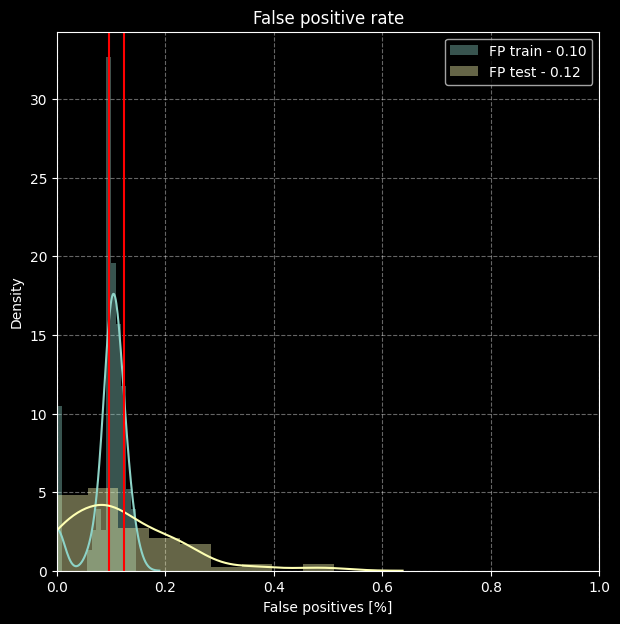

In [42]:
fig, ax = get_subplots()

sns.distplot(fp_train, ax=ax, label=f'FP train - {fp_train.mean():2.2f}')
ax.axvline(fp_train.mean(), color='red')
sns.distplot(fp_test, ax=ax, label=f'FP test - {fp_test.mean():2.2f}')
ax.axvline(fp_test.mean(), color='red')

ax.set_xlim([0, 1])
ax.set_xlabel('False positives [%]')
ax.set_ylabel('Density')
ax.set_title('False positive rate')
ax.legend()

### 5.5 Accuracy visualisation


**How to interpret:** 🧐
- darker is better, indicating a higher accuracy

In [43]:
error = pd.Series(acc_test)

error = pd.cut(error, [i/10 for i in range(0,11,1)], labels=[i for i in range(10)])
error = error.fillna(0)

fig = visualize_hexagons(hex_list, error)

show(fig)

0it [00:00, ?it/s]

# References 🕵️
---

Academic articles:

- [Spatio Temporal Graphs](https://arxiv.org/abs/2006.10637)
- [Recipe for a General, Powerful, Scalable Graph Transformer](https://arxiv.org/pdf/2205.12454.pdf)

Blog posts:
- [Uber - Efficiently Managing the Supply and Demand on Uber’s Big Data Platform](https://eng.uber.com/supply-demand-big-data-platform/)
- [Uber - H3 data](https://eng.uber.com/h3/)
- [Supply-Demand Gaps in Real-Time using Geospatial Data](https://towardsdatascience.com/supply-demand-gaps-in-real-time-using-geospatial-data-b125a87119c1)
- [Geospatial Analytics for Supply-Demand Gaps to Increase Utilization](https://medium.com/locale-ai/geospatial-analytics-for-supply-demand-gaps-to-increase-utilization-5ad60ae337e)
- [Netflix - It's all about A/B testing](https://netflixtechblog.com/its-all-a-bout-testing-the-netflix-experimentation-platform-4e1ca458c15?gi=a97935c3e13b)
- [Glovo - How to Simulate a Global Delivery Platform](https://medium.com/glovo-engineering/how-to-simulate-a-global-delivery-platform-7aa5fa475d88)